In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, f1_score, jaccard_score
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import cv2


In [ ]:
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_img_dir  = "/content/drive/MyDrive/Road_dataset/tiff/train"
train_mask_dir = "/content/drive/MyDrive/Road_dataset/tiff/train_labels"

🔹 Cell 3: Load Dataset (PNG)

In [ ]:
# 🟩 Code Cell: Load & Preprocess PNG Images and Masks
def load_data(image_dir, mask_dir, img_size=(128, 128)):
    images, masks = [], []
    missing_masks = []
    broken_images = []
    broken_masks = []

    for filename in sorted(os.listdir(image_dir)):
        if not filename.lower().endswith(".png"):
            continue

        img_path  = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir,  filename)

        if not os.path.exists(mask_path):
            missing_masks.append(filename)
            continue

        # read files
        img  = cv2.imread(img_path,  cv2.IMREAD_COLOR)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            broken_images.append(filename)
            continue
        if mask is None:
            broken_masks.append(filename)
            continue

        # resize
        img  = cv2.resize(img,  img_size)
        mask = cv2.resize(mask, img_size)

        # normalize image to [0,1]
        img = img.astype(np.float32) / 255.0

        # binarize mask to 0 or 1
        _, mask_bin = cv2.threshold(mask, 127, 1, cv2.THRESH_BINARY)
        mask_bin = mask_bin.astype(np.float32)[..., np.newaxis]

        images.append(img)
        masks.append(mask_bin)

    # summary of what was loaded / skipped
    print(f"[INFO] Loaded {len(images)} image–mask pairs")
    if missing_masks:
        print(f"[WARN] Missing masks for {len(missing_masks)} images: {missing_masks[:5]}{'...' if len(missing_masks)>5 else ''}")
    if broken_images:
        print(f"[WARN] Failed to load {len(broken_images)} image files: {broken_images[:5]}{'...' if len(broken_images)>5 else ''}")
    if broken_masks:
        print(f"[WARN] Failed to load {len(broken_masks)} mask files: {broken_masks[:5]}{'...' if len(broken_masks)>5 else ''}")

    return np.array(images), np.array(masks)

# Usage:
train_img_dir  = "/content/drive/MyDrive/Road_dataset/tiff/train"
train_mask_dir = "/content/drive/MyDrive/Road_dataset/tiff/train_labels"
X, y = load_data(train_img_dir, train_mask_dir, img_size=(256, 256))


[INFO] Loaded 1108 image–mask pairs


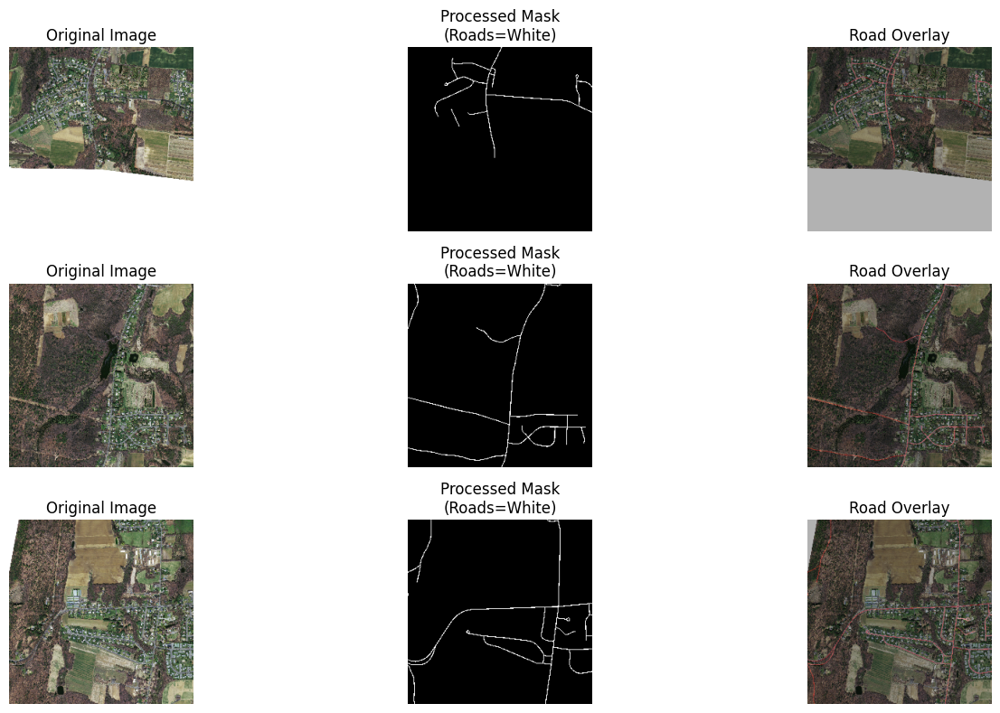

In [ ]:
# 🔹 Cell 4: Visualize Sample Inputs, Masks, and Road Overlay

import matplotlib.pyplot as plt
import cv2

# Show three random samples (or change indices as you like)
idxs = [0, 1, 2]

plt.figure(figsize=(15, 8))
for i, idx in enumerate(idxs):
    img  = (X[idx] * 255).astype('uint8')           # back to 0–255
    mask = (y[idx].squeeze() * 255).astype('uint8')  # single‐channel mask

    # Convert BGR→RGB for display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Create a red overlay where mask == 255
    red_mask = np.zeros_like(img)
    red_mask[..., 2] = mask                          # put mask into R channel
    overlay = cv2.addWeighted(img, 0.7, red_mask, 0.3, 0)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # Plot Original
    plt.subplot(3, 3, i*3 + 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis('off')

    # Plot Mask
    plt.subplot(3, 3, i*3 + 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Processed Mask\n(Roads=White)")
    plt.axis('off')

    # Plot Overlay
    plt.subplot(3, 3, i*3 + 3)
    plt.imshow(overlay_rgb)
    plt.title("Road Overlay")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# 🔹 Cell 5: Custom Metrics, Loss & U‑Net Model Definition

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import (Input, Conv2D, BatchNormalization, Activation,
                                     MaxPooling2D, Dropout, UpSampling2D, concatenate)
from tensorflow.keras.models import Model
from tensorflow.keras.losses import BinaryCrossentropy

# Losses
bce = tf.keras.losses.BinaryCrossentropy()

def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    inter = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * inter + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    inter = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - inter
    return (inter + smooth) / (union + smooth)
def combo_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    dice = 1 - dice_coef(y_true, y_pred)
    iou = 1 - iou_coef(y_true, y_pred)
    return 0.4 * bce + 0.3 * dice + 0.3 * iou

def bce_dice_loss(y_true, y_pred):
    return bce(y_true, y_pred) + (1 - dice_coef(y_true, y_pred))
from tensorflow.keras.layers import Add, Multiply


from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Dropout
from tensorflow.keras.models import Model

def build_segnet(input_shape=(256, 256, 3), n_classes=1, dropout_rate=0.1):
    inputs = Input(shape=input_shape)

    # — Encoder —
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(inputs)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)  # 128x128
    x = Dropout(dropout_rate)(x)

    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)  # 64x64
    x = Dropout(dropout_rate)(x)

    x = Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)  # 32x32
    x = Dropout(dropout_rate)(x)

    # — Decoder —
    x = UpSampling2D((2, 2))(x)  # 64x64
    x = Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout_rate)(x)

    x = UpSampling2D((2, 2))(x)  # 128x128
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout_rate)(x)

    x = UpSampling2D((2, 2))(x)  # 256x256
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    # — Output —
    output = Conv2D(n_classes, (1, 1), activation='sigmoid')(x)

    model = Model(inputs=inputs, outputs=output)
    return model
model = build_segnet(input_shape=(256, 256, 3))
model.summary()





Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 128)  │         3,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 256)  │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 256)  │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64, 64, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 512)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 256)  │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128, 128, 256)  │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128, 128, 256)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 256)  │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,320,961 (20.30 MB)

 Trainable params: 5,317,377 (20.28 MB)

 Non-trainable params: 3,584 (14.00 KB)

In [ ]:
# 🔹 Cell 6: Load & Split Data

from sklearn.model_selection import train_test_split

# X, y have been loaded and preprocessed in Cell 3
# Split into 70% train / 15% val / 15% test

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42,
    shuffle=True
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=42,
    shuffle=True
)

print(f"Training set:   {X_train.shape} inputs, {y_train.shape} masks")
print(f"Validation set: {X_val.shape} inputs, {y_val.shape} masks")
print(f"Test set:       {X_test.shape} inputs, {y_test.shape} masks")


Training set:   (775, 256, 256, 3) inputs, (775, 256, 256, 1) masks
Validation set: (166, 256, 256, 3) inputs, (166, 256, 256, 1) masks
Test set:       (167, 256, 256, 3) inputs, (167, 256, 256, 1) masks


In [ ]:
# 🟩 Cell 7: Optimized Training with Early Stopping, LR Scheduler, and Checkpoint

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt


model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=combo_loss,
    metrics=[dice_coef, iou_coef, 'accuracy']
)


# Callbacks
checkpoint_cb = ModelCheckpoint("best_unet_model.h5",
                                save_best_only=True,
                                monitor="val_loss",
                                mode="min",
                                verbose=1)

earlystop_cb = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,       # minimum change to qualify as an improvement
    patience=10,          # stop after 10 epochs of no improvement
    verbose=1,
    restore_best_weights=True
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=16,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)



Epoch 1/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step - accuracy: 0.5282 - dice_coef: 0.0998 - iou_coef: 0.0526 - loss: 0.8766
Epoch 1: val_loss improved from inf to 0.78525, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 61s 563ms/step - accuracy: 0.5287 - dice_coef: 0.0998 - iou_coef: 0.0526 - loss: 0.8760 - val_accuracy: 0.9476 - val_dice_coef: 0.0824 - val_iou_coef: 0.0431 - val_loss: 0.7853 - learning_rate: 1.0000e-04
Epoch 2/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.6392 - dice_coef: 0.0969 - iou_coef: 0.0510 - loss: 0.8205
Epoch 2: val_loss improved from 0.78525 to 0.75698, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.6400 - dice_coef: 0.0971 - iou_coef: 0.0511 - loss: 0.8202 - val_accuracy: 0.9524 - val_dice_coef: 0.0818 - val_iou_coef: 0.0428 - val_loss: 0.7570 - learning_rate: 1.0000e-04
Epoch 3/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.7151 - dice_coef: 0.1011 - iou_coef: 0.0533 - loss: 0.8050
Epoch 3: val_loss improved from 0.75698 to 0.73749, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.7155 - dice_coef: 0.1013 - iou_coef: 0.0534 - loss: 0.8048 - val_accuracy: 0.9534 - val_dice_coef: 0.0804 - val_iou_coef: 0.0420 - val_loss: 0.7375 - learning_rate: 1.0000e-04
Epoch 4/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.7675 - dice_coef: 0.1045 - iou_coef: 0.0552 - loss: 0.7912
Epoch 4: val_loss improved from 0.73749 to 0.72437, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.7678 - dice_coef: 0.1047 - iou_coef: 0.0553 - loss: 0.7910 - val_accuracy: 0.9534 - val_dice_coef: 0.0798 - val_iou_coef: 0.0417 - val_loss: 0.7244 - learning_rate: 1.0000e-04
Epoch 5/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.7943 - dice_coef: 0.1202 - iou_coef: 0.0641 - loss: 0.7721
Epoch 5: val_loss improved from 0.72437 to 0.70886, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.7949 - dice_coef: 0.1200 - iou_coef: 0.0639 - loss: 0.7721 - val_accuracy: 0.9534 - val_dice_coef: 0.0793 - val_iou_coef: 0.0413 - val_loss: 0.7089 - learning_rate: 1.0000e-04
Epoch 6/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8308 - dice_coef: 0.1160 - iou_coef: 0.0617 - loss: 0.7616
Epoch 6: val_loss improved from 0.70886 to 0.70116, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.8310 - dice_coef: 0.1162 - iou_coef: 0.0617 - loss: 0.7614 - val_accuracy: 0.9534 - val_dice_coef: 0.0786 - val_iou_coef: 0.0410 - val_loss: 0.7012 - learning_rate: 1.0000e-04
Epoch 7/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8521 - dice_coef: 0.1259 - iou_coef: 0.0673 - loss: 0.7450
Epoch 7: val_loss improved from 0.70116 to 0.68964, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.8523 - dice_coef: 0.1259 - iou_coef: 0.0673 - loss: 0.7449 - val_accuracy: 0.9534 - val_dice_coef: 0.0773 - val_iou_coef: 0.0403 - val_loss: 0.6896 - learning_rate: 1.0000e-04
Epoch 8/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8714 - dice_coef: 0.1263 - iou_coef: 0.0675 - loss: 0.7325
Epoch 8: val_loss improved from 0.68964 to 0.68630, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.8714 - dice_coef: 0.1266 - iou_coef: 0.0677 - loss: 0.7323 - val_accuracy: 0.9534 - val_dice_coef: 0.0791 - val_iou_coef: 0.0413 - val_loss: 0.6863 - learning_rate: 1.0000e-04
Epoch 9/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8833 - dice_coef: 0.1401 - iou_coef: 0.0754 - loss: 0.7140
Epoch 9: val_loss did not improve from 0.68630
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.8834 - dice_coef: 0.1401 - iou_coef: 0.0755 - loss: 0.7139 - val_accuracy: 0.9534 - val_dice_coef: 0.0786 - val_iou_coef: 0.0410 - val_loss: 0.6924 - learning_rate: 1.0000e-04
Epoch 10/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8960 - dice_coef: 0.1463 - iou_coef: 0.0791 - loss: 0.6985
Epoch 10: val_loss improved from 0.68630 to 0.68022, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.8961 - dice_coef: 0.1465 - iou_coef: 0.0792 - loss: 0.6984 - val_accuracy: 0.9531 - val_dice_coef: 0.0860 - val_iou_coef: 0.0450 - val_loss: 0.6802 - learning_rate: 1.0000e-04
Epoch 11/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9020 - dice_coef: 0.1565 - iou_coef: 0.0850 - loss: 0.6829
Epoch 11: val_loss improved from 0.68022 to 0.66180, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9020 - dice_coef: 0.1566 - iou_coef: 0.0851 - loss: 0.6827 - val_accuracy: 0.9529 - val_dice_coef: 0.0930 - val_iou_coef: 0.0488 - val_loss: 0.6618 - learning_rate: 1.0000e-04
Epoch 12/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9108 - dice_coef: 0.1688 - iou_coef: 0.0923 - loss: 0.6656
Epoch 12: val_loss improved from 0.66180 to 0.64901, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.9109 - dice_coef: 0.1689 - iou_coef: 0.0923 - loss: 0.6655 - val_accuracy: 0.9517 - val_dice_coef: 0.1083 - val_iou_coef: 0.0574 - val_loss: 0.6490 - learning_rate: 1.0000e-04
Epoch 13/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9184 - dice_coef: 0.1769 - iou_coef: 0.0973 - loss: 0.6511
Epoch 13: val_loss did not improve from 0.64901
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9184 - dice_coef: 0.1770 - iou_coef: 0.0973 - loss: 0.6510 - val_accuracy: 0.9517 - val_dice_coef: 0.1133 - val_iou_coef: 0.0602 - val_loss: 0.6493 - learning_rate: 1.0000e-04
Epoch 14/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9232 - dice_coef: 0.1883 - iou_coef: 0.1041 - loss: 0.6360
Epoch 14: val_loss improved from 0.64901 to 0.61549, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9232 - dice_coef: 0.1885 - iou_coef: 0.1042 - loss: 0.6358 - val_accuracy: 0.9511 - val_dice_coef: 0.1496 - val_iou_coef: 0.0811 - val_loss: 0.6155 - learning_rate: 1.0000e-04
Epoch 15/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9286 - dice_coef: 0.2007 - iou_coef: 0.1118 - loss: 0.6205
Epoch 15: val_loss improved from 0.61549 to 0.59977, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9285 - dice_coef: 0.2010 - iou_coef: 0.1120 - loss: 0.6203 - val_accuracy: 0.9384 - val_dice_coef: 0.2004 - val_iou_coef: 0.1117 - val_loss: 0.5998 - learning_rate: 1.0000e-04
Epoch 16/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9307 - dice_coef: 0.2180 - iou_coef: 0.1226 - loss: 0.6045
Epoch 16: val_loss improved from 0.59977 to 0.58037, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9308 - dice_coef: 0.2182 - iou_coef: 0.1227 - loss: 0.6043 - val_accuracy: 0.9343 - val_dice_coef: 0.2360 - val_iou_coef: 0.1342 - val_loss: 0.5804 - learning_rate: 1.0000e-04
Epoch 17/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9327 - dice_coef: 0.2425 - iou_coef: 0.1382 - loss: 0.5857
Epoch 17: val_loss did not improve from 0.58037
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9328 - dice_coef: 0.2424 - iou_coef: 0.1381 - loss: 0.5857 - val_accuracy: 0.9259 - val_dice_coef: 0.2501 - val_iou_coef: 0.1433 - val_loss: 0.5818 - learning_rate: 1.0000e-04
Epoch 18/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9329 - dice_coef: 0.2625 - iou_coef: 0.1515 - loss: 0.5708
Epoch 18: val_loss improved from 0.58037 to 0.56363, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9331 - dice_coef: 0.2622 - iou_coef: 0.1513 - loss: 0.5708 - val_accuracy: 0.9315 - val_dice_coef: 0.2686 - val_iou_coef: 0.1556 - val_loss: 0.5636 - learning_rate: 1.0000e-04
Epoch 19/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9399 - dice_coef: 0.2653 - iou_coef: 0.1533 - loss: 0.5614
Epoch 19: val_loss improved from 0.56363 to 0.54994, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9399 - dice_coef: 0.2656 - iou_coef: 0.1536 - loss: 0.5611 - val_accuracy: 0.9423 - val_dice_coef: 0.2719 - val_iou_coef: 0.1578 - val_loss: 0.5499 - learning_rate: 1.0000e-04
Epoch 20/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9420 - dice_coef: 0.2906 - iou_coef: 0.1703 - loss: 0.5433
Epoch 20: val_loss improved from 0.54994 to 0.54093, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9421 - dice_coef: 0.2907 - iou_coef: 0.1703 - loss: 0.5432 - val_accuracy: 0.9352 - val_dice_coef: 0.2997 - val_iou_coef: 0.1768 - val_loss: 0.5409 - learning_rate: 1.0000e-04
Epoch 21/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9433 - dice_coef: 0.3115 - iou_coef: 0.1848 - loss: 0.5290
Epoch 21: val_loss improved from 0.54093 to 0.52966, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9434 - dice_coef: 0.3116 - iou_coef: 0.1849 - loss: 0.5289 - val_accuracy: 0.9386 - val_dice_coef: 0.3109 - val_iou_coef: 0.1846 - val_loss: 0.5297 - learning_rate: 1.0000e-04
Epoch 22/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9474 - dice_coef: 0.3305 - iou_coef: 0.1984 - loss: 0.5135
Epoch 22: val_loss did not improve from 0.52966
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9474 - dice_coef: 0.3305 - iou_coef: 0.1984 - loss: 0.5135 - val_accuracy: 0.9432 - val_dice_coef: 0.2875 - val_iou_coef: 0.1690 - val_loss: 0.5453 - learning_rate: 1.0000e-04
Epoch 23/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9489 - dice_coef: 0.3445 - iou_coef: 0.2087 - loss: 0.5036
Epoch 23: val_loss improved from 0.52966 to 0.49542, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9489 - dice_coef: 0.3447 - iou_coef: 0.2088 - loss: 0.5035 - val_accuracy: 0.9545 - val_dice_coef: 0.3415 - val_iou_coef: 0.2065 - val_loss: 0.4954 - learning_rate: 1.0000e-04
Epoch 24/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9507 - dice_coef: 0.3590 - iou_coef: 0.2193 - loss: 0.4927
Epoch 24: val_loss improved from 0.49542 to 0.47705, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.9507 - dice_coef: 0.3593 - iou_coef: 0.2196 - loss: 0.4925 - val_accuracy: 0.9512 - val_dice_coef: 0.3805 - val_iou_coef: 0.2353 - val_loss: 0.4771 - learning_rate: 1.0000e-04
Epoch 25/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9497 - dice_coef: 0.3901 - iou_coef: 0.2427 - loss: 0.4763
Epoch 25: val_loss improved from 0.47705 to 0.47567, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9498 - dice_coef: 0.3900 - iou_coef: 0.2427 - loss: 0.4763 - val_accuracy: 0.9521 - val_dice_coef: 0.3821 - val_iou_coef: 0.2368 - val_loss: 0.4757 - learning_rate: 1.0000e-04
Epoch 26/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9550 - dice_coef: 0.3937 - iou_coef: 0.2455 - loss: 0.4692
Epoch 26: val_loss did not improve from 0.47567
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9549 - dice_coef: 0.3943 - iou_coef: 0.2459 - loss: 0.4690 - val_accuracy: 0.9371 - val_dice_coef: 0.3486 - val_iou_coef: 0.2121 - val_loss: 0.5103 - learning_rate: 1.0000e-04
Epoch 27/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9521 - dice_coef: 0.4199 - iou_coef: 0.2661 - loss: 0.4574
Epoch 27: val_loss improved from 0.47567 to 0.45436, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9522 - dice_coef: 0.4200 - iou_coef: 0.2662 - loss: 0.4573 - val_accuracy: 0.9545 - val_dice_coef: 0.4194 - val_iou_coef: 0.2658 - val_loss: 0.4544 - learning_rate: 1.0000e-04
Epoch 28/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9550 - dice_coef: 0.4321 - iou_coef: 0.2762 - loss: 0.4476
Epoch 28: val_loss improved from 0.45436 to 0.44051, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9551 - dice_coef: 0.4322 - iou_coef: 0.2762 - loss: 0.4476 - val_accuracy: 0.9554 - val_dice_coef: 0.4400 - val_iou_coef: 0.2824 - val_loss: 0.4405 - learning_rate: 1.0000e-04
Epoch 29/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9564 - dice_coef: 0.4506 - iou_coef: 0.2914 - loss: 0.4360
Epoch 29: val_loss improved from 0.44051 to 0.43784, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9564 - dice_coef: 0.4506 - iou_coef: 0.2914 - loss: 0.4359 - val_accuracy: 0.9542 - val_dice_coef: 0.4481 - val_iou_coef: 0.2891 - val_loss: 0.4378 - learning_rate: 1.0000e-04
Epoch 30/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9594 - dice_coef: 0.4588 - iou_coef: 0.2983 - loss: 0.4283
Epoch 30: val_loss improved from 0.43784 to 0.42809, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9593 - dice_coef: 0.4589 - iou_coef: 0.2984 - loss: 0.4283 - val_accuracy: 0.9567 - val_dice_coef: 0.4626 - val_iou_coef: 0.3012 - val_loss: 0.4281 - learning_rate: 1.0000e-04
Epoch 31/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9582 - dice_coef: 0.4772 - iou_coef: 0.3139 - loss: 0.4193
Epoch 31: val_loss did not improve from 0.42809
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9582 - dice_coef: 0.4771 - iou_coef: 0.3138 - loss: 0.4193 - val_accuracy: 0.9531 - val_dice_coef: 0.4613 - val_iou_coef: 0.3002 - val_loss: 0.4314 - learning_rate: 1.0000e-04
Epoch 32/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9600 - dice_coef: 0.4776 - iou_coef: 0.3143 - loss: 0.4176
Epoch 32: val_loss did not improve from 0.42809
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9600 - dice_coef: 0.4779 - iou_coef: 0.3146 - loss: 0.4174 - val_accuracy: 0.9547 - val_dice_coef: 0.4632 - val_iou_coef: 0.3021 - val_lo

49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9600 - dice_coef: 0.4886 - iou_coef: 0.3241 - loss: 0.4117 - val_accuracy: 0.9516 - val_dice_coef: 0.4785 - val_iou_coef: 0.3148 - val_loss: 0.4251 - learning_rate: 1.0000e-04
Epoch 34/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9601 - dice_coef: 0.4923 - iou_coef: 0.3274 - loss: 0.4104
Epoch 34: val_loss improved from 0.42509 to 0.41536, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9601 - dice_coef: 0.4928 - iou_coef: 0.3278 - loss: 0.4101 - val_accuracy: 0.9549 - val_dice_coef: 0.4897 - val_iou_coef: 0.3246 - val_loss: 0.4154 - learning_rate: 1.0000e-04
Epoch 35/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9624 - dice_coef: 0.5156 - iou_coef: 0.3480 - loss: 0.3937
Epoch 35: val_loss improved from 0.41536 to 0.41054, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9624 - dice_coef: 0.5155 - iou_coef: 0.3479 - loss: 0.3938 - val_accuracy: 0.9565 - val_dice_coef: 0.4974 - val_iou_coef: 0.3314 - val_loss: 0.4105 - learning_rate: 1.0000e-04
Epoch 36/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9602 - dice_coef: 0.5266 - iou_coef: 0.3578 - loss: 0.3906
Epoch 36: val_loss did not improve from 0.41054
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9602 - dice_coef: 0.5264 - iou_coef: 0.3577 - loss: 0.3906 - val_accuracy: 0.9515 - val_dice_coef: 0.4902 - val_iou_coef: 0.3250 - val_loss: 0.4214 - learning_rate: 1.0000e-04
Epoch 37/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9610 - dice_coef: 0.5282 - iou_coef: 0.3598 - loss: 0.3899
Epoch 37: val_loss improved from 0.41054 to 0.40876, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9610 - dice_coef: 0.5281 - iou_coef: 0.3597 - loss: 0.3899 - val_accuracy: 0.9572 - val_dice_coef: 0.5020 - val_iou_coef: 0.3355 - val_loss: 0.4088 - learning_rate: 1.0000e-04
Epoch 38/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9630 - dice_coef: 0.5420 - iou_coef: 0.3722 - loss: 0.3792
Epoch 38: val_loss improved from 0.40876 to 0.40103, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9630 - dice_coef: 0.5417 - iou_coef: 0.3719 - loss: 0.3795 - val_accuracy: 0.9581 - val_dice_coef: 0.5129 - val_iou_coef: 0.3452 - val_loss: 0.4010 - learning_rate: 1.0000e-04
Epoch 39/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9615 - dice_coef: 0.5485 - iou_coef: 0.3787 - loss: 0.3768
Epoch 39: val_loss improved from 0.40103 to 0.39807, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9616 - dice_coef: 0.5482 - iou_coef: 0.3784 - loss: 0.3769 - val_accuracy: 0.9588 - val_dice_coef: 0.5190 - val_iou_coef: 0.3508 - val_loss: 0.3981 - learning_rate: 1.0000e-04
Epoch 40/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9625 - dice_coef: 0.5439 - iou_coef: 0.3742 - loss: 0.3794
Epoch 40: val_loss did not improve from 0.39807
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9626 - dice_coef: 0.5441 - iou_coef: 0.3743 - loss: 0.3792 - val_accuracy: 0.9567 - val_dice_coef: 0.5094 - val_iou_coef: 0.3422 - val_loss: 0.4036 - learning_rate: 1.0000e-04
Epoch 41/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9641 - dice_coef: 0.5461 - iou_coef: 0.3762 - loss: 0.3767
Epoch 41: val_loss improved from 0.39807 to 0.39566, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9641 - dice_coef: 0.5464 - iou_coef: 0.3765 - loss: 0.3765 - val_accuracy: 0.9610 - val_dice_coef: 0.5215 - val_iou_coef: 0.3531 - val_loss: 0.3957 - learning_rate: 1.0000e-04
Epoch 42/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9630 - dice_coef: 0.5645 - iou_coef: 0.3942 - loss: 0.3669
Epoch 42: val_loss did not improve from 0.39566
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9630 - dice_coef: 0.5643 - iou_coef: 0.3939 - loss: 0.3670 - val_accuracy: 0.9553 - val_dice_coef: 0.4935 - val_iou_coef: 0.3284 - val_loss: 0.4145 - learning_rate: 1.0000e-04
Epoch 43/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9653 - dice_coef: 0.5513 - iou_coef: 0.3814 - loss: 0.3732
Epoch 43: val_loss improved from 0.39566 to 0.39181, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9652 - dice_coef: 0.5517 - iou_coef: 0.3818 - loss: 0.3730 - val_accuracy: 0.9603 - val_dice_coef: 0.5278 - val_iou_coef: 0.3590 - val_loss: 0.3918 - learning_rate: 1.0000e-04
Epoch 44/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9650 - dice_coef: 0.5687 - iou_coef: 0.3980 - loss: 0.3631
Epoch 44: val_loss improved from 0.39181 to 0.39156, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9650 - dice_coef: 0.5687 - iou_coef: 0.3980 - loss: 0.3632 - val_accuracy: 0.9582 - val_dice_coef: 0.5358 - val_iou_coef: 0.3663 - val_loss: 0.3916 - learning_rate: 1.0000e-04
Epoch 45/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9659 - dice_coef: 0.5783 - iou_coef: 0.4074 - loss: 0.3563
Epoch 45: val_loss did not improve from 0.39156
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9659 - dice_coef: 0.5781 - iou_coef: 0.4073 - loss: 0.3565 - val_accuracy: 0.9556 - val_dice_coef: 0.4158 - val_iou_coef: 0.2659 - val_loss: 0.4608 - learning_rate: 1.0000e-04
Epoch 46/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9648 - dice_coef: 0.5765 - iou_coef: 0.4060 - loss: 0.3598
Epoch 46: val_loss improved from 0.39156 to 0.38757, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.9648 - dice_coef: 0.5765 - iou_coef: 0.4060 - loss: 0.3597 - val_accuracy: 0.9619 - val_dice_coef: 0.5319 - val_iou_coef: 0.3628 - val_loss: 0.3876 - learning_rate: 1.0000e-04
Epoch 47/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9638 - dice_coef: 0.5806 - iou_coef: 0.4097 - loss: 0.3584
Epoch 47: val_loss did not improve from 0.38757
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9639 - dice_coef: 0.5806 - iou_coef: 0.4097 - loss: 0.3583 - val_accuracy: 0.9588 - val_dice_coef: 0.5356 - val_iou_coef: 0.3661 - val_loss: 0.3914 - learning_rate: 1.0000e-04
Epoch 48/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9656 - dice_coef: 0.5871 - iou_coef: 0.4161 - loss: 0.3524
Epoch 48: val_loss improved from 0.38757 to 0.38479, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9656 - dice_coef: 0.5870 - iou_coef: 0.4160 - loss: 0.3524 - val_accuracy: 0.9610 - val_dice_coef: 0.5419 - val_iou_coef: 0.3721 - val_loss: 0.3848 - learning_rate: 1.0000e-04
Epoch 49/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9656 - dice_coef: 0.5890 - iou_coef: 0.4180 - loss: 0.3511
Epoch 49: val_loss improved from 0.38479 to 0.38388, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9656 - dice_coef: 0.5890 - iou_coef: 0.4180 - loss: 0.3512 - val_accuracy: 0.9622 - val_dice_coef: 0.5447 - val_iou_coef: 0.3747 - val_loss: 0.3839 - learning_rate: 1.0000e-04
Epoch 50/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9671 - dice_coef: 0.5864 - iou_coef: 0.4159 - loss: 0.3518
Epoch 50: val_loss improved from 0.38388 to 0.38296, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9671 - dice_coef: 0.5866 - iou_coef: 0.4161 - loss: 0.3517 - val_accuracy: 0.9627 - val_dice_coef: 0.5470 - val_iou_coef: 0.3769 - val_loss: 0.3830 - learning_rate: 1.0000e-04
Epoch 51/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9668 - dice_coef: 0.5947 - iou_coef: 0.4238 - loss: 0.3470
Epoch 51: val_loss did not improve from 0.38296
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9668 - dice_coef: 0.5947 - iou_coef: 0.4239 - loss: 0.3469 - val_accuracy: 0.9627 - val_dice_coef: 0.5438 - val_iou_coef: 0.3739 - val_loss: 0.3843 - learning_rate: 1.0000e-04
Epoch 52/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9686 - dice_coef: 0.6014 - iou_coef: 0.4303 - loss: 0.3404
Epoch 52: val_loss did not improve from 0.38296
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9685 - dice_coef: 0.6013 - iou_coef: 0.4303 - loss: 0.3405 - val_accuracy: 0.9635 - val_dice_coef: 0.5422 - val_iou_coef: 0.3725 - val_lo

49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9676 - dice_coef: 0.6046 - iou_coef: 0.4338 - loss: 0.3409 - val_accuracy: 0.9635 - val_dice_coef: 0.5449 - val_iou_coef: 0.3750 - val_loss: 0.3824 - learning_rate: 1.0000e-04
Epoch 56/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9680 - dice_coef: 0.6088 - iou_coef: 0.4383 - loss: 0.3379
Epoch 56: val_loss did not improve from 0.38236
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9680 - dice_coef: 0.6088 - iou_coef: 0.4382 - loss: 0.3379 - val_accuracy: 0.9636 - val_dice_coef: 0.5404 - val_iou_coef: 0.3709 - val_loss: 0.3844 - learning_rate: 1.0000e-04
Epoch 57/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9683 - dice_coef: 0.6192 - iou_coef: 0.4491 - loss: 0.3303
Epoch 57: val_loss improved from 0.38236 to 0.38082, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9683 - dice_coef: 0.6190 - iou_coef: 0.4488 - loss: 0.3304 - val_accuracy: 0.9625 - val_dice_coef: 0.5520 - val_iou_coef: 0.3817 - val_loss: 0.3808 - learning_rate: 1.0000e-04
Epoch 58/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9689 - dice_coef: 0.6204 - iou_coef: 0.4510 - loss: 0.3295
Epoch 58: val_loss did not improve from 0.38082
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9689 - dice_coef: 0.6203 - iou_coef: 0.4508 - loss: 0.3297 - val_accuracy: 0.9629 - val_dice_coef: 0.5480 - val_iou_coef: 0.3780 - val_loss: 0.3821 - learning_rate: 1.0000e-04
Epoch 59/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9698 - dice_coef: 0.6269 - iou_coef: 0.4577 - loss: 0.3240
Epoch 59: val_loss improved from 0.38082 to 0.38076, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9698 - dice_coef: 0.6266 - iou_coef: 0.4574 - loss: 0.3243 - val_accuracy: 0.9613 - val_dice_coef: 0.5538 - val_iou_coef: 0.3833 - val_loss: 0.3808 - learning_rate: 1.0000e-04
Epoch 60/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9695 - dice_coef: 0.6197 - iou_coef: 0.4499 - loss: 0.3291
Epoch 60: val_loss did not improve from 0.38076
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9695 - dice_coef: 0.6197 - iou_coef: 0.4499 - loss: 0.3292 - val_accuracy: 0.9629 - val_dice_coef: 0.5539 - val_iou_coef: 0.3836 - val_loss: 0.3812 - learning_rate: 1.0000e-04
Epoch 61/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9679 - dice_coef: 0.6167 - iou_coef: 0.4469 - loss: 0.3336
Epoch 61: val_loss did not improve from 0.38076
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9679 - dice_coef: 0.6169 - iou_coef: 0.4472 - loss: 0.3334 - val_accuracy: 0.9635 - val_dice_coef: 0.5500 - val_iou_coef: 0.3799 - val_lo

49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9690 - dice_coef: 0.6254 - iou_coef: 0.4556 - loss: 0.3273 - val_accuracy: 0.9629 - val_dice_coef: 0.5538 - val_iou_coef: 0.3835 - val_loss: 0.3794 - learning_rate: 1.0000e-04
Epoch 63/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9681 - dice_coef: 0.6317 - iou_coef: 0.4623 - loss: 0.3243
Epoch 63: val_loss did not improve from 0.37945
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.9682 - dice_coef: 0.6316 - iou_coef: 0.4622 - loss: 0.3243 - val_accuracy: 0.9606 - val_dice_coef: 0.5555 - val_iou_coef: 0.3850 - val_loss: 0.3830 - learning_rate: 1.0000e-04
Epoch 64/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9685 - dice_coef: 0.6277 - iou_coef: 0.4587 - loss: 0.3265
Epoch 64: val_loss did not improve from 0.37945
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9685 - dice_coef: 0.6278 - iou_coef: 0.4588 - loss: 0.3263 - val_accuracy: 0.9633 - val_dice_coef: 0.5578 - val_iou_coef: 0.3872 - val_l

49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.9708 - dice_coef: 0.6468 - iou_coef: 0.4785 - loss: 0.3119 - val_accuracy: 0.9628 - val_dice_coef: 0.5592 - val_iou_coef: 0.3886 - val_loss: 0.3784 - learning_rate: 5.0000e-05
Epoch 70/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9697 - dice_coef: 0.6398 - iou_coef: 0.4711 - loss: 0.3184
Epoch 70: val_loss improved from 0.37840 to 0.37791, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9698 - dice_coef: 0.6401 - iou_coef: 0.4714 - loss: 0.3182 - val_accuracy: 0.9633 - val_dice_coef: 0.5602 - val_iou_coef: 0.3896 - val_loss: 0.3779 - learning_rate: 5.0000e-05
Epoch 71/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9705 - dice_coef: 0.6417 - iou_coef: 0.4733 - loss: 0.3161
Epoch 71: val_loss did not improve from 0.37791
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9705 - dice_coef: 0.6419 - iou_coef: 0.4736 - loss: 0.3159 - val_accuracy: 0.9633 - val_dice_coef: 0.5625 - val_iou_coef: 0.3918 - val_loss: 0.3783 - learning_rate: 5.0000e-05
Epoch 72/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9714 - dice_coef: 0.6564 - iou_coef: 0.4894 - loss: 0.3046
Epoch 72: val_loss did not improve from 0.37791
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9714 - dice_coef: 0.6561 - iou_coef: 0.4890 - loss: 0.3049 - val_accuracy: 0.9636 - val_dice_coef: 0.5572 - val_iou_coef: 0.3868 - val_lo

49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9722 - dice_coef: 0.6643 - iou_coef: 0.4981 - loss: 0.2980 - val_accuracy: 0.9633 - val_dice_coef: 0.5614 - val_iou_coef: 0.3907 - val_loss: 0.3778 - learning_rate: 2.5000e-05
Epoch 77/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9710 - dice_coef: 0.6548 - iou_coef: 0.4875 - loss: 0.3071
Epoch 77: val_loss did not improve from 0.37781
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9710 - dice_coef: 0.6548 - iou_coef: 0.4875 - loss: 0.3070 - val_accuracy: 0.9635 - val_dice_coef: 0.5627 - val_iou_coef: 0.3920 - val_loss: 0.3781 - learning_rate: 2.5000e-05
Epoch 78/100
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9703 - dice_coef: 0.6519 - iou_coef: 0.4845 - loss: 0.3100
Epoch 78: val_loss did not improve from 0.37781
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9704 - dice_coef: 0.6521 - iou_coef: 0.4847 - loss: 0.3098 - val_accuracy: 0.9634 - val_dice_coef: 0.5628 - val_iou_coef: 0.3922 - val_lo

In [ ]:
# 🟩 Cell 7: Optimized Training with Early Stopping, LR Scheduler, and Checkpoint

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt


# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=bce_dice_loss,
    metrics=[dice_coef, iou_coef, 'accuracy']
)

# Callbacks
checkpoint_cb = ModelCheckpoint("best_unet_model.h5",
                                save_best_only=True,
                                monitor="val_loss",
                                mode="min",
                                verbose=1)

earlystop_cb = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,       # minimum change to qualify as an improvement
    patience=10,          # stop after 10 epochs of no improvement
    verbose=1,
    restore_best_weights=True
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=16,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)



Epoch 1/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.9706 - dice_coef: 0.6498 - iou_coef: 0.4820 - loss: 0.4701
Epoch 1: val_loss improved from inf to 0.60104, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 27s 296ms/step - accuracy: 0.9706 - dice_coef: 0.6496 - iou_coef: 0.4817 - loss: 0.4703 - val_accuracy: 0.9642 - val_dice_coef: 0.5509 - val_iou_coef: 0.3808 - val_loss: 0.6010 - learning_rate: 1.0000e-04
Epoch 2/150
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9710 - dice_coef: 0.6388 - iou_coef: 0.4703 - loss: 0.4797
Epoch 2: val_loss improved from 0.60104 to 0.59637, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9710 - dice_coef: 0.6387 - iou_coef: 0.4703 - loss: 0.4797 - val_accuracy: 0.9639 - val_dice_coef: 0.5544 - val_iou_coef: 0.3841 - val_loss: 0.5964 - learning_rate: 1.0000e-04
Epoch 3/150
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9707 - dice_coef: 0.6430 - iou_coef: 0.4746 - loss: 0.4747
Epoch 3: val_loss did not improve from 0.59637
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9707 - dice_coef: 0.6429 - iou_coef: 0.4745 - loss: 0.4748 - val_accuracy: 0.9632 - val_dice_coef: 0.5521 - val_iou_coef: 0.3819 - val_loss: 0.5985 - learning_rate: 1.0000e-04
Epoch 4/150
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9716 - dice_coef: 0.6507 - iou_coef: 0.4834 - loss: 0.4635
Epoch 4: val_loss did not improve from 0.59637
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9716 - dice_coef: 0.6505 - iou_coef: 0.4832 - loss: 0.4639 - val_accuracy: 0.9636 - val_dice_coef: 0.5486 - val_iou_coef: 0.3786 - val_loss: 

49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.9715 - dice_coef: 0.6460 - iou_coef: 0.4779 - loss: 0.4693 - val_accuracy: 0.9635 - val_dice_coef: 0.5553 - val_iou_coef: 0.3849 - val_loss: 0.5942 - learning_rate: 1.0000e-04
Epoch 6/150
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9725 - dice_coef: 0.6564 - iou_coef: 0.4894 - loss: 0.4540
Epoch 6: val_loss did not improve from 0.59417
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9724 - dice_coef: 0.6561 - iou_coef: 0.4890 - loss: 0.4546 - val_accuracy: 0.9629 - val_dice_coef: 0.5594 - val_iou_coef: 0.3887 - val_loss: 0.5950 - learning_rate: 1.0000e-04
Epoch 7/150
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9719 - dice_coef: 0.6466 - iou_coef: 0.4784 - loss: 0.4682
Epoch 7: val_loss did not improve from 0.59417
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9719 - dice_coef: 0.6466 - iou_coef: 0.4785 - loss: 0.4681 - val_accuracy: 0.9638 - val_dice_coef: 0.5503 - val_iou_coef: 0.3803 - val_loss: 

49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.9720 - dice_coef: 0.6440 - iou_coef: 0.4759 - loss: 0.4688 - val_accuracy: 0.9638 - val_dice_coef: 0.5572 - val_iou_coef: 0.3867 - val_loss: 0.5935 - learning_rate: 5.0000e-05
Epoch 12/150
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9723 - dice_coef: 0.6598 - iou_coef: 0.4931 - loss: 0.4525
Epoch 12: val_loss did not improve from 0.59350
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9723 - dice_coef: 0.6598 - iou_coef: 0.4930 - loss: 0.4526 - val_accuracy: 0.9637 - val_dice_coef: 0.5551 - val_iou_coef: 0.3848 - val_loss: 0.5961 - learning_rate: 5.0000e-05
Epoch 13/150
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9724 - dice_coef: 0.6604 - iou_coef: 0.4935 - loss: 0.4522
Epoch 13: val_loss did not improve from 0.59350
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9724 - dice_coef: 0.6603 - iou_coef: 0.4934 - loss: 0.4522 - val_accuracy: 0.9639 - val_dice_coef: 0.5553 - val_iou_coef: 0.3849 - val_lo

In [ ]:
# prompt: code to print final result of the model accuracy and all its parameter  after saving best model

# Load the best saved model
from tensorflow.keras.models import load_model

best_model = load_model("best_unet_model.h5",
                       custom_objects={'bce_dice_loss': bce_dice_loss,
                                       'dice_coef': dice_coef,
                                       'iou_coef': iou_coef})

# Evaluate the model on the test set
loss, dice, iou, accuracy = best_model.evaluate(X_test, y_test, verbose=0)

# Print the results
print(f"Test Loss: {loss:.4f}")
print(f"Test Dice Coefficient: {dice:.4f}")
print(f"Test IoU: {iou:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

# # Print model parameters
# print("\nModel Parameters:")
# for layer in best_model.layers:
#     print(f"Layer Name: {layer.name}")
#     if hasattr(layer, 'kernel_size'):
#         print(f"  Kernel Size: {layer.kernel_size}")
#     if hasattr(layer, 'filters'):
#         print(f"  Filters: {layer.filters}")
#     if hasattr(layer, 'activation'):
#         print(f"  Activation: {layer.activation}")
#     if hasattr(layer, 'units'):
#         print(f"  Units: {layer.units}")
#     print("-" * 20)


Test Loss: 0.5993
Test Dice Coefficient: 0.5636
Test IoU: 0.3926
Test Accuracy: 0.9620


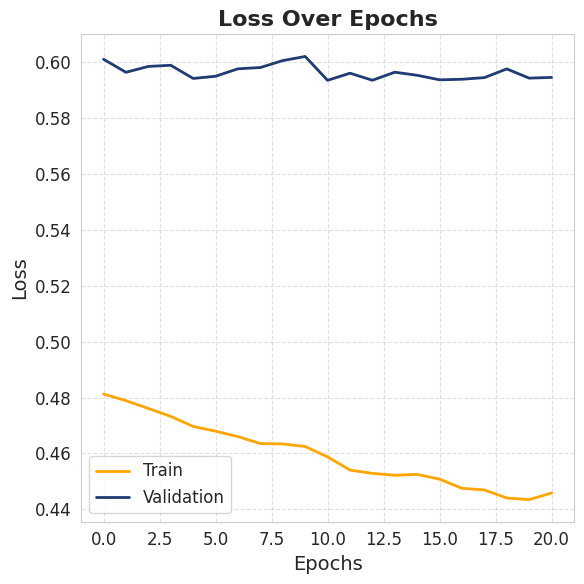

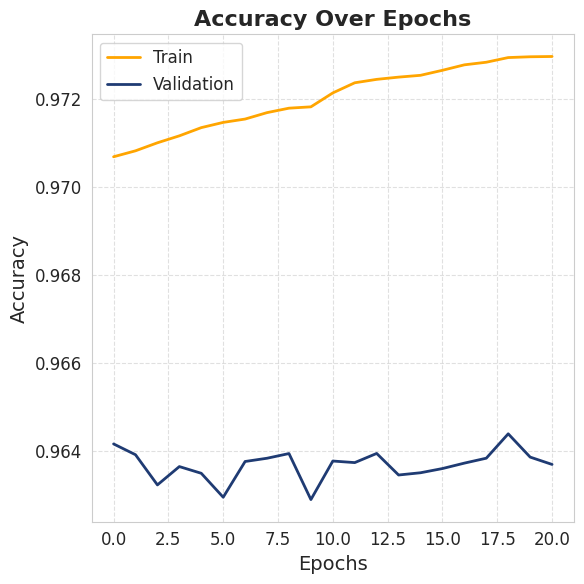

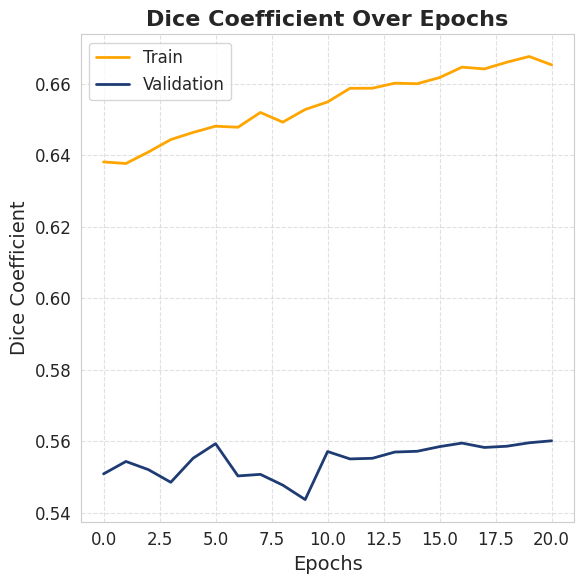

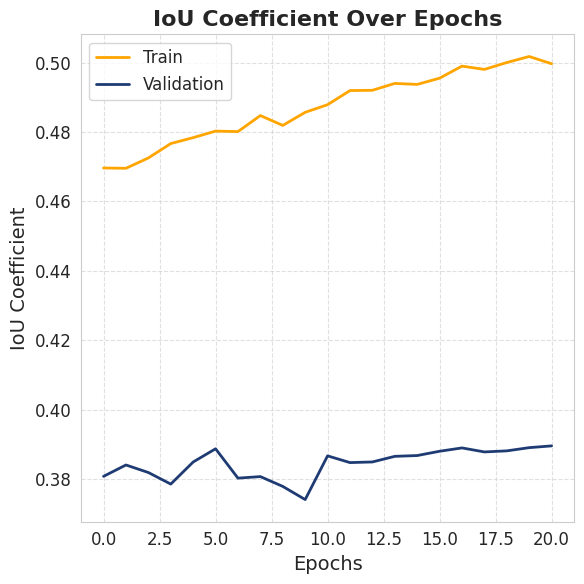

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Visual Settings
sns.set_style("whitegrid")
plt.rcParams.update({
    "font.size": 12,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "legend.fontsize": 12,
    "lines.linewidth": 2,
})

# 🟠 Orange: Train | 🔵 Dark Blue: Validation
def plot_training_metrics_individually(history):
    metrics = ['loss', 'accuracy', 'dice_coef', 'iou_coef']
    titles = ['Loss', 'Accuracy', 'Dice Coefficient', 'IoU Coefficient']
    colors = ['#FFA500', '#1f3b73']  # Orange and Dark Blue

    for i, metric in enumerate(metrics):
        plt.figure(figsize=(6, 6))  # Square box
        plt.plot(history.history[metric], label='Train', color=colors[0])
        plt.plot(history.history[f'val_{metric}'], label='Validation', color=colors[1])
        plt.title(f"{titles[i]} Over Epochs", fontsize=16, fontweight='bold')
        plt.xlabel("Epochs")
        plt.ylabel(titles[i])
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

# Run it
plot_training_metrics_individually(history)





6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step


<ipython-input-14-6524d6ab92df>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Accuracy", "Precision", "Recall", "F1 Score", "IoU", "Dice"],


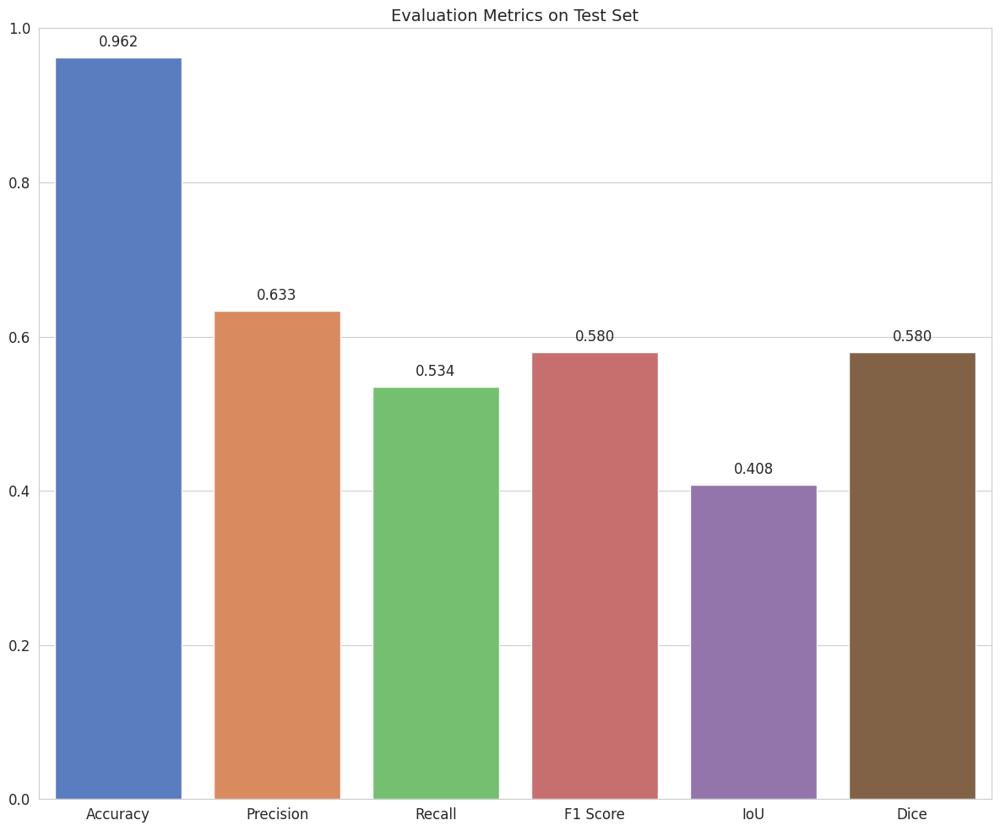

In [ ]:
# 🟩 Cell 9: Evaluate on Test Set

# Predict on test set
preds = model.predict(X_test)
# Reshape to (-1, 256*256) to match the actual mask size
preds_bin = (preds > 0.5).astype(np.uint8).reshape(-1, 256*256)
y_true_flat = y_test.reshape(-1, 256*256)

# Flatten for sklearn metrics
flat_pred = preds_bin.flatten()
flat_true = y_true_flat.flatten()

# 🧮 Metrics
acc  = accuracy_score(flat_true, flat_pred)
prec = precision_score(flat_true, flat_pred)
rec  = recall_score(flat_true, flat_pred)
f1   = f1_score(flat_true, flat_pred)
iou  = jaccard_score(flat_true, flat_pred)
dice = (2 * prec * rec) / (prec + rec)

# 📊 Plot as Bar Chart
plt.figure(figsize=(12, 10))
sns.barplot(x=["Accuracy", "Precision", "Recall", "F1 Score", "IoU", "Dice"],
            y=[acc, prec, rec, f1, iou, dice],
            palette="muted")
plt.ylim(0, 1)
plt.title("Evaluation Metrics on Test Set", fontsize=14)
for i, val in enumerate([acc, prec, rec, f1, iou, dice]):
    plt.text(i, val + 0.01, f"{val:.3f}", ha='center', va='bottom', fontsize=12)
plt.tight_layout()
plt.show()

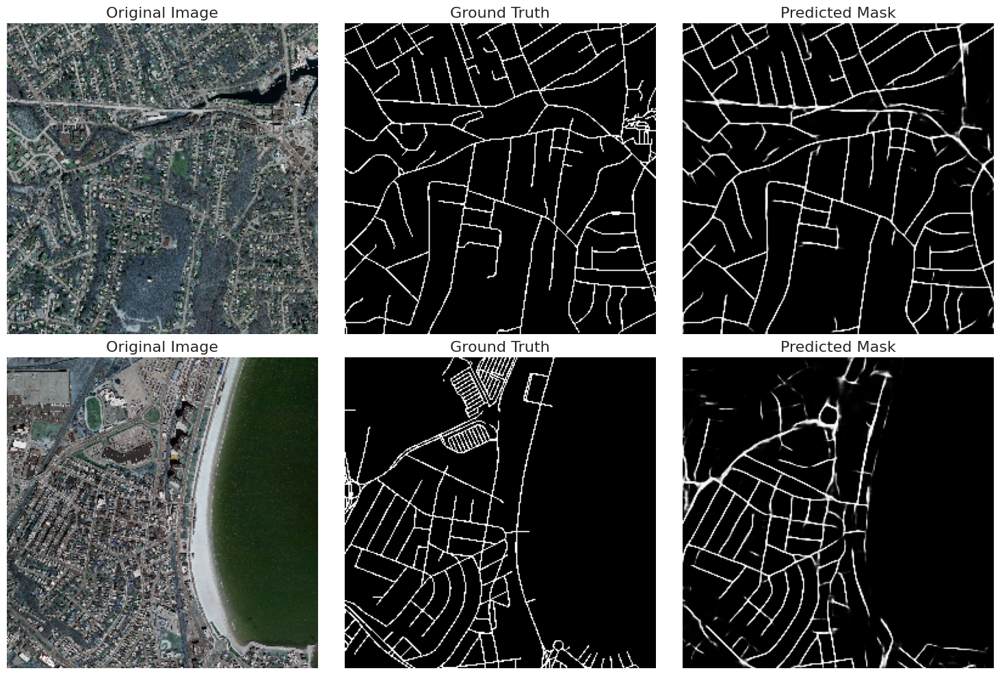

In [ ]:
# 🟩 Cell 10: Show Predicted vs Ground Truth Overlay

import matplotlib.pyplot as plt

def show_predictions(X, y_true, y_pred, num=2):
    plt.figure(figsize=(15, num * 5))

    for i in range(num):
        # Original image
        plt.subplot(num, 3, i * 3 + 1)
        plt.imshow(X[i])
        plt.title("Original Image")
        plt.axis("off")

        # Ground Truth (B/W)
        plt.subplot(num, 3, i * 3 + 2)
        plt.imshow(y_true[i].squeeze(), cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")

        # Predicted Mask (B/W)
        plt.subplot(num, 3, i * 3 + 3)
        plt.imshow(y_pred[i].squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Example call (assuming X_test, y_test, preds are numpy arrays)
show_predictions(X_test, y_test, preds, num=2)



25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


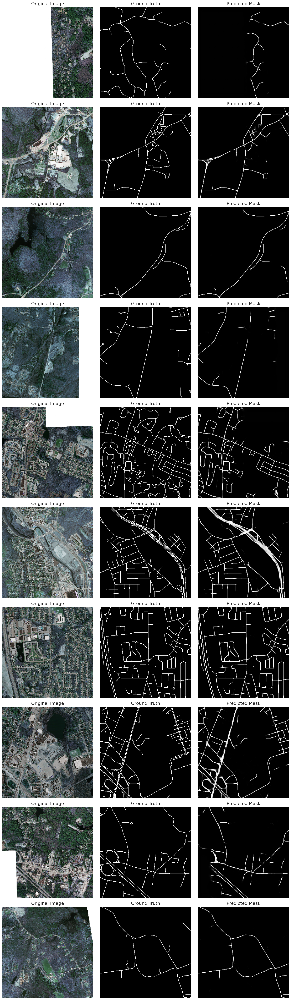

In [ ]:
## on training dataset
show_predictions(X_train, y_train, model.predict(X_train), num=10)

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step


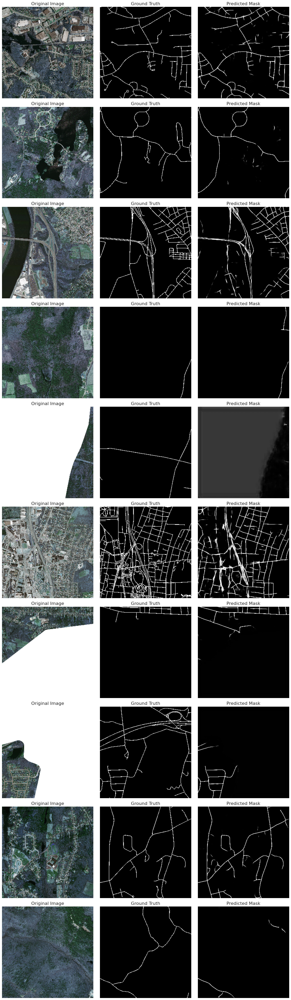

In [ ]:
# For validation set
show_predictions(X_val, y_val, model.predict(X_val), num=10)

In [ ]:
model.save("road_segmentation_model.h5")




In [ ]:
# Save model
model.save("model_segnet.h5")  # Change to model_attention_unet.h5 / model_segnet.h5 as needed

# Save history
import pickle
with open("history_segneet.pkl", "wb") as f:
    pickle.dump(history.history, f)
